# New Haven, New Hampshire NDVI in Leafmap with `jupyter-tiler`

To run this notebook, you'll need the dependencies in this repository's `"play"` dependency group.
For most people, installing the right dependencies might look like:

```bash
uv sync --group dev --group test --group play
```

## First, grab some data and do a calculation on it

We want to see that we can display calculated data from an in-memory dataset.

### Get Sentinel 2 data as an Xarray `DataSet`

#### Define a Pyrenees Bounding Box

In [1]:
import os
os.environ["SSL_CERT_FILE"] = "/etc/pki/tls/certs/ca-bundle.crt"
os.environ["CURL_CA_BUNDLE"] = "/etc/pki/tls/certs/ca-bundle.crt"

In [2]:
from leafmap.plot import bbox_to_gdf

#bbox = [-72.99321, 41.23109, -72.85227, 41.37502]
#bbox = [1.306, 42.527, 1.551, 42.662]
#bbox = [1.0, 42.5, 1.7, 43.1]
bbox = [-1.7, 42.2, 3.0, 43.4]
bbox_to_gdf(bbox).explore()

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.


#### Query the Element84 Earth Search STAC catalog for Sentinel2 data

In [3]:
from pystac_client import Client

sentinel2_stac_items = (
    Client.open("https://earth-search.aws.element84.com/v1")
    .search(
        collections=["sentinel-2-l2a"],
        bbox=bbox,
        datetime="2024-01-01/2024-02-01",
        query={"eo:cloud_cover": {"lt": 10}},
    )
    .item_collection()
)
sentinel2_stac_items

#### Load the data into an Xarray `Dataset`

In [4]:
import odc.stac

sentinel2_dataset = odc.stac.load(
    sentinel2_stac_items,
    bands=["red", "green", "blue", "swir16"],
    chunks={'x': 2048, 'y': 2048},
    bbox=bbox,
    resolution=20,
    groupby="solar_day",
)
sentinel2_dataset

<xarray.Dataset> Size: 9GB
Dimensions:      (y: 7200, x: 19404, time: 8)
Coordinates:
  * y            (y) float64 58kB 4.816e+06 4.816e+06 ... 4.672e+06 4.672e+06
  * x            (x) float64 155kB 1.119e+05 1.12e+05 1.12e+05 ... 5e+05 5e+05
  * time         (time) datetime64[ns] 64B 2024-01-07T10:49:19.113000 ... 202...
    spatial_ref  int32 4B 32631
Data variables:
    red          (time, y, x) uint16 2GB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    green        (time, y, x) uint16 2GB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    blue         (time, y, x) uint16 2GB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir16       (time, y, x) uint16 2GB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>

In [5]:
s2_visible = sentinel2_dataset.max(dim='time')
s2_visible

<xarray.Dataset> Size: 1GB
Dimensions:      (y: 7200, x: 19404)
Coordinates:
  * y            (y) float64 58kB 4.816e+06 4.816e+06 ... 4.672e+06 4.672e+06
  * x            (x) float64 155kB 1.119e+05 1.12e+05 1.12e+05 ... 5e+05 5e+05
    spatial_ref  int32 4B 32631
Data variables:
    red          (y, x) uint16 279MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    green        (y, x) uint16 279MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    blue         (y, x) uint16 279MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    swir16       (y, x) uint16 279MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>

In [6]:
config_options = {'SSL_CERT_FILE': '/etc/pki/tls/certs/ca-bundle.crt',
                  'CURL_CA_BUNDLE': '/etc/pki/tls/certs/ca-bundle.crt',
                  'AWS_VIRTUAL_HOSTING': 'FALSE',
                  'GDAL_HTTP_UNSAFESSL': 'YES'}
import rasterio

## Dask

In [7]:
import dask.config
dask.config.set({'distributed.dashboard.link': '{scheme}://{host}:{port}/status'})

In [8]:
worker_env = {
               'SSL_CERT_FILE': '/etc/pki/tls/certs/ca-bundle.crt',
               'CURL_CA_BUNDLE': '/etc/pki/tls/certs/ca-bundle.crt',
               'AWS_VIRTUAL_HOSTING': 'FALSE',
               'GDAL_HTTP_UNSAFESSL': 'YES'}

In [9]:
from distributed import Client as DaskClient
dask_client = DaskClient(n_workers=4, memory_limit='6GiB',dashboard_address=':9987')
dask_client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:9987/status,
Dashboard: http://127.0.0.1:9987/status,Workers: 4
Total threads: 4,Total memory: 24.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39003,Workers: 0
Dashboard: http://127.0.0.1:9987/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:41337,Total threads: 1
Dashboard: http://127.0.0.1:42099/status,Memory: 6.00 GiB
Nanny: tcp://127.0.0.1:44579,


In [10]:
def export_env(env_dict):
    import os
    for key, value in env_dict.items():
        os.environ[key] = value

dask_client.run(export_env, worker_env)

{'tcp://127.0.0.1:40823': None,
 'tcp://127.0.0.1:41337': None,
 'tcp://127.0.0.1:42445': None,
 'tcp://127.0.0.1:42845': None}

In [11]:
from distributed.diagnostics.plugin import WorkerPlugin

def configure_workers_environment():
        
    rio_env = rasterio.Env(
        AWS_VIRTUAL_HOSTING='FALSE',
        GDAL_HTTP_UNSAFESSL='YES',
        GDAL_DISABLE_READDIR_ON_OPEN='EMPTY_DIR',
        SSL_CERT_FILE='/etc/pki/tls/certs/ca-bundle.crt',
        CURL_CA_BUNDLE='/etc/pki/tls/certs/ca-bundle.crt',
    )
    rio_env.__enter__()
    return None
    
dask_client.register_worker_callbacks(configure_workers_environment)

{'tcp://127.0.0.1:40823': {'status': 'OK'},
 'tcp://127.0.0.1:41337': {'status': 'OK'},
 'tcp://127.0.0.1:42445': {'status': 'OK'},
 'tcp://127.0.0.1:42845': {'status': 'OK'}}

### Visualize raw data in RGB

In [15]:
%%time
with rasterio.Env(**config_options):
    rgb = sentinel2_dataset[["red", "green", "blue"]].to_array(dim="band").max("time")
    rgb_scaled = (rgb / 3000).clip(0, 1)  # Scale and clip for display
    rgb_scaled

CPU times: user 7.88 ms, sys: 4.95 ms, total: 12.8 ms
Wall time: 12.9 ms


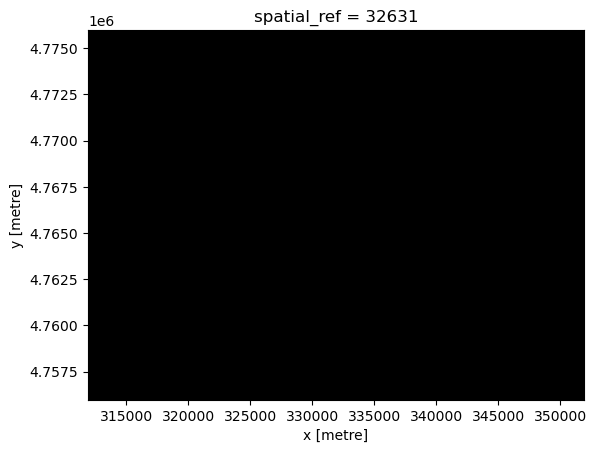

In [13]:
#Visualize subset
with rasterio.Env(**config_options):
    rgb_scaled[:,2000:3000,10000:12000].plot.imshow()

### Calculate NDSI

/work/scratch/env/eynardbg/.conda/envs/jgis-pangeo/lib/python3.12/site-packages/dask/_task_spec.py:768: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


CPU times: user 5.1 s, sys: 1.01 s, total: 6.1 s
Wall time: 1min 1s


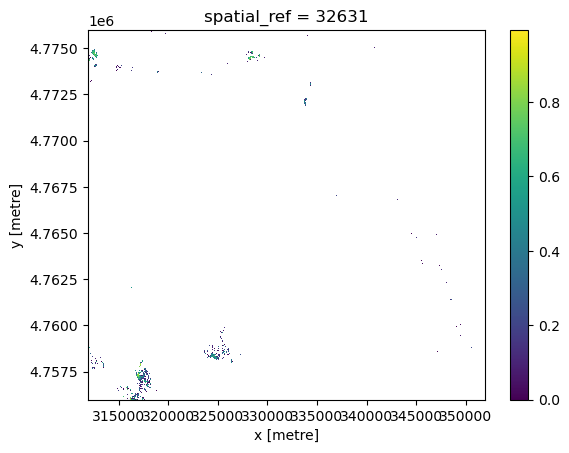

In [17]:
%%time
with rasterio.Env(**config_options):
    ndsi = (
        (
            (s2_visible.green - s2_visible.swir16)
            / (s2_visible.green + s2_visible.swir16)
        )
        .where(lambda ndsi: ndsi < 1)
#        .compute()
    )
    
    ndsi[2000:3000,10000:12000].plot.imshow()

## Test out `jupyter-tiler`

...with the `ndvi` `DataArray` we just calculated!

In [20]:
type(ndsi)

xarray.core.dataarray.DataArray

In [22]:
from jupyter_tiler.titiler import add_data_array

url = await add_data_array(ndsi, colormap_range=(0, 1))

[2026-09-02 14:30:52 +0000] [2831488] [INFO] Running on http://127.0.0.1:42613 (CTRL + C to quit)


In [23]:
url

'/proxy/42613/3567482a-4d4a-4e18-93b8-526ff2d63468/tiles/WebMercatorQuad/{z}/{x}/{y}.png?scale=1&colormap_name=viridis&reproject=max&rescale=0%2C1'

In [24]:
import leafmap

#center = [41.321482, -72.932739]
center = [42.59, 1.42]
m = leafmap.Map(center=center, zoom=10)
m

Map(center=[42.59, 1.42], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_ou…

In [25]:
m.add_tile_layer(
    url=url,
    name="NH NDVI",
    attribution="Sentinel 2",
)

In [14]:
vegetation = ndvi > 0.4
url_veg = await add_data_array(vegetation, colormap_range=(0, 1))

In [15]:
m.add_tile_layer(
    url=url_veg,
    name="Veg",
    attribution="Sentinel 2",
)